Environment: velocity

In [2]:
import pandas
import scanpy
import hdf5plugin
import anndata
import matplotlib
from matplotlib import pyplot
import cellrank
import numpy
import gseapy
import scipy
import seaborn
import scipy
import decoupler
import scvelo
import IPython
import single_cell_analysis
import pyucell

In [2]:
from importlib import reload

single_cell_analysis = reload(single_cell_analysis)

In [43]:
# Load data from Cellrank and SDEvelo

working_directory = "RNA Sequencing Data/"
base_name = "cellrank_version_5"
adata = scanpy.read_h5ad(
    working_directory+f"/diffusion_map_anndata.h5ad"
)
driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes.csv",
    index_col=0
)
combined_driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes_combined.csv",
    index_col=0
)
adata.obs["group"] = adata.obs["group"].cat.reorder_categories(["MEF", "mESC", "control", "Hic2"])

In [94]:
# Load adata with raw counts and filter

adata_raw = scanpy.read_h5ad(
    working_directory+f"/splice_counts.h5ad"
)

# If all genes should be used instead of just top 2000 variable

scanpy.pp.filter_genes(adata_raw, min_cells=20)
scanpy.pp.normalize_total(adata_raw, target_sum=1e6)
scanpy.pp.log1p(adata_raw)
adata_raw.obs = adata.obs
adata_raw.obsm = adata.obsm
adata_raw.uns["term_states_fwd_colors"] = adata.uns["term_states_fwd_colors"]
adata_raw.uns = adata.uns

print(adata_raw)

AnnData object with n_obs × n_vars = 12791 × 20917
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'seurat_clusters', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'latent_time', 'sde_velocity_self_transition', 'manual_root', 'manual_end', 'sde_velocity_pseudotime', 'leiden', 'macrostates_fwd', 'term_states_fwd', 'term_states_fwd_probs', 'init_states_fwd', 'init_states_fwd_probs', 'fate_probabilities_Dead end', 'fate_probabilities_Stem cell', 'macrostate', 'early_or_late', 'epithelial_score', 'keratinocyte_score', 'stem_cell_score', 'fibroblast_score', 'neuron_score', 'kupffer_score', 'apoptosis_score', 'fibroblast_UCell', 'keratinocyte_UCell', 'epithelial_UCell', 'stem_cell_UCell', 'p53_UCell', 'p53_score'
    var: 'ensemble_ids', 'gene_symbol', 'n_cells'
    uns: 'T_fwd_params', 'coarse_fwd', 'diffmap_evals', 'diffmap_neighbors', 'draw_graph', 'eigendecomposition_fwd', 'gro

In [5]:
# Read ChIP-seq targets
base_name = "ChIP Sequencing Data/chipseq_targets"

hic2_target_scores = pandas.read_csv(f"{base_name}_hic2_scores.csv", index_col=0)
klf4_hic2_target_scores = pandas.read_csv(f"{base_name}_klf4_hic2_scores.csv", index_col=0)
klf4_control_target_scores = pandas.read_csv(f"{base_name}_klf4_control_scores.csv", index_col=0)

hic2_targets = numpy.loadtxt(f"{base_name}_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_hic2_targets = numpy.loadtxt(f"{base_name}_klf4_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_control_targets = numpy.loadtxt(f"{base_name}_klf4_control_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_targets = numpy.intersect1d(klf4_hic2_targets, klf4_control_targets)
shared_targets = numpy.intersect1d(hic2_targets, klf4_targets)

In [6]:
# Load bulk differential expression results

bulk_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_combined.csv", index_col=0)
bulk_metadata = pandas.read_csv("RNA Sequencing Data/bulk_sequencing_metadata.csv", index_col=0)
samples = bulk_metadata.index.to_list()
reprogramming_columns = bulk_de.columns[bulk_de.columns.str.contains("Reprogramming")]
reprogramming_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_reprogramming.csv", index_col=0)
mef_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mef.csv", index_col=0)
mesc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mesc.csv", index_col=0)
ipsc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_ipsc.csv", index_col=0)

In [7]:
# Variable genes and Cellrank drivers
variable_genes = adata.var_names.to_numpy()
variable_in_bulk = numpy.intersect1d(variable_genes, bulk_de.index.to_numpy())
stem_cell_drivers = driver_df.sort_values("Dead end_corr", ascending=True).head(100).index.to_numpy()
dead_end_drivers = driver_df.sort_values("Dead end_corr", ascending=False).head(100).index.to_numpy()

In [8]:
# Load list of transcription factors

tf_df = pandas.read_csv("ChIP Sequencing Data/Mus_musculus_TF.txt", sep="\t")
tf_array = tf_df["Symbol"].to_numpy()

In [9]:
differentially_expressed_genes = reprogramming_de.loc[variable_in_bulk].query("padj < 0.05").index.to_numpy()

In [10]:
# Find Hic2 target TFs that change significantly during reprogramming

# All target transcription factors
target_tfs = numpy.intersect1d(shared_targets, tf_array)

# Target transcription factors for which Hic2 changes expression significantly
de_target_tfs = numpy.intersect1d(target_tfs, differentially_expressed_genes)

# Differentially expressed targets that are drivers of dead end
de_dead_end_drivers = numpy.intersect1d(de_target_tfs, dead_end_drivers)

# Differentially expressed targets that are drivers of stem cells
de_stem_cell_drivers = numpy.intersect1d(de_target_tfs, stem_cell_drivers)

# Activity of network components

In [13]:
network_genes = ["Hic2", "Klf4", "Myc"]

In [278]:
go = gseapy.get_library("GO_Molecular_Function_2025", organism="Mouse")

2026-03-23 16:22:10 | [INFO] Downloading and generating Enrichr library gene sets...
2026-03-23 16:22:10 | [INFO] Library is already downloaded in: /home/avesta/m26_losu/.cache/gseapy/Enrichr.GO_Molecular_Function_2025.gmt, use local file


In [281]:
msigdb.keys()

dict_keys(['TNF-alpha Signaling via NF-kB', 'Hypoxia', 'Cholesterol Homeostasis', 'Mitotic Spindle', 'Wnt-beta Catenin Signaling', 'TGF-beta Signaling', 'IL-6/JAK/STAT3 Signaling', 'DNA Repair', 'G2-M Checkpoint', 'Apoptosis', 'Notch Signaling', 'Adipogenesis', 'Estrogen Response Early', 'Estrogen Response Late', 'Androgen Response', 'Myogenesis', 'Protein Secretion', 'Interferon Alpha Response', 'Interferon Gamma Response', 'Apical Junction', 'Apical Surface', 'Hedgehog Signaling', 'Complement', 'Unfolded Protein Response', 'PI3K/AKT/mTOR  Signaling', 'mTORC1 Signaling', 'E2F Targets', 'Myc Targets V1', 'Myc Targets V2', 'Epithelial Mesenchymal Transition', 'Inflammatory Response', 'Xenobiotic Metabolism', 'Fatty Acid Metabolism', 'Oxidative Phosphorylation', 'Glycolysis', 'Reactive Oxygen Species Pathway', 'p53 Pathway', 'UV Response Up', 'UV Response Dn', 'Angiogenesis', 'heme Metabolism', 'Coagulation', 'IL-2/STAT5 Signaling', 'Bile Acid Metabolism', 'Pperoxisome', 'Allograft Rejec

In [283]:
e2f_targets = numpy.array(pandas.Series(msigdb["E2F Targets"]).str.capitalize())

In [284]:
g2m_markers = numpy.array(pandas.Series(msigdb["G2-M Checkpoint"]).str.capitalize())

In [ ]:
# Get gene sets
cell_markers = gseapy.get_library("PanglaoDB_Augmented_2021", organism="Mouse")
epithelial_markers = numpy.array(pandas.Series(cell_markers["Epithelial Cells"]).str.capitalize())
keratinocyte_markers = numpy.array(pandas.Series(cell_markers["Keratinocytes"]).str.capitalize())
stem_cell_markers = numpy.array(pandas.Series(cell_markers["Pluripotent Stem Cells"]).str.capitalize())
fibroblast_markers = numpy.array(pandas.Series(cell_markers["Fibroblasts"]).str.capitalize())
neuron_markers = numpy.array(pandas.Series(cell_markers["Neurons"]).str.capitalize())
kupffer_markers = numpy.array(pandas.Series(cell_markers["Kupffer Cells"]).str.capitalize())
msigdb = gseapy.get_library("MSigDB_Hallmark_2020", organism="Mouse")
p53_markers = numpy.array(pandas.Series(msigdb["p53 Pathway"]).str.capitalize())

2026-03-23 13:22:52 | [INFO] Downloading and generating Enrichr library gene sets...
2026-03-23 13:22:52 | [INFO] Library is already downloaded in: /home/avesta/m26_losu/.cache/gseapy/Enrichr.PanglaoDB_Augmented_2021.gmt, use local file
2026-03-23 13:22:52 | [INFO] Downloading and generating Enrichr library gene sets...
2026-03-23 13:22:52 | [INFO] Library is already downloaded in: /home/avesta/m26_losu/.cache/gseapy/Enrichr.MSigDB_Hallmark_2020.gmt, use local file


## With top 2000 most variable

In [286]:
signatures = {
    "fibroblast": fibroblast_markers,
    "keratinocyte": keratinocyte_markers,
    "epithelial": epithelial_markers,
    "stem_cell": stem_cell_markers,
    "p53": p53_markers,
    "e2f": e2f_targets,
    "g2m": g2m_markers
}

# Remove old scores
for name in signatures.keys():
    ucell_key = f"{name}_UCell"
    if ucell_key in adata.obs_keys():
        del adata.obs[ucell_key]

pyucell.compute_ucell_scores(adata, signatures=signatures, chunk_size=500)

In [287]:
# Score cell types

for name, genes in signatures.items():
    scanpy.tl.score_genes(
        adata,
        gene_list=numpy.intersect1d(genes, adata.var_names),
        score_name=f"{name}_score",
        use_raw=False
    )

network_scores = ["keratinocyte_score", "stem_cell_score", "p53_score"]
network_scores_ucell = ["keratinocyte_UCell", "stem_cell_UCell", "p53_UCell"]

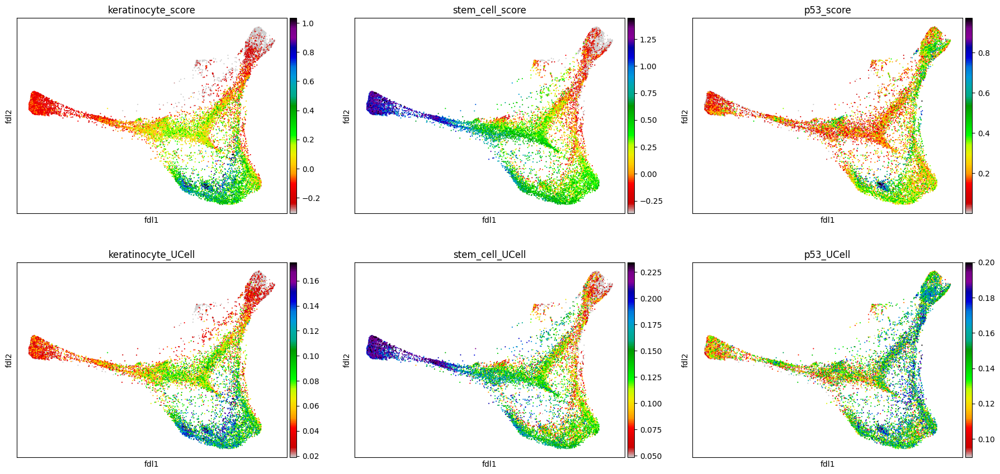

In [187]:
scanpy.pl.embedding(adata, "fdl", color=network_scores+network_scores_ucell, cmap="nipy_spectral_r", vmax="p99.9", vmin="p10", ncols=3)

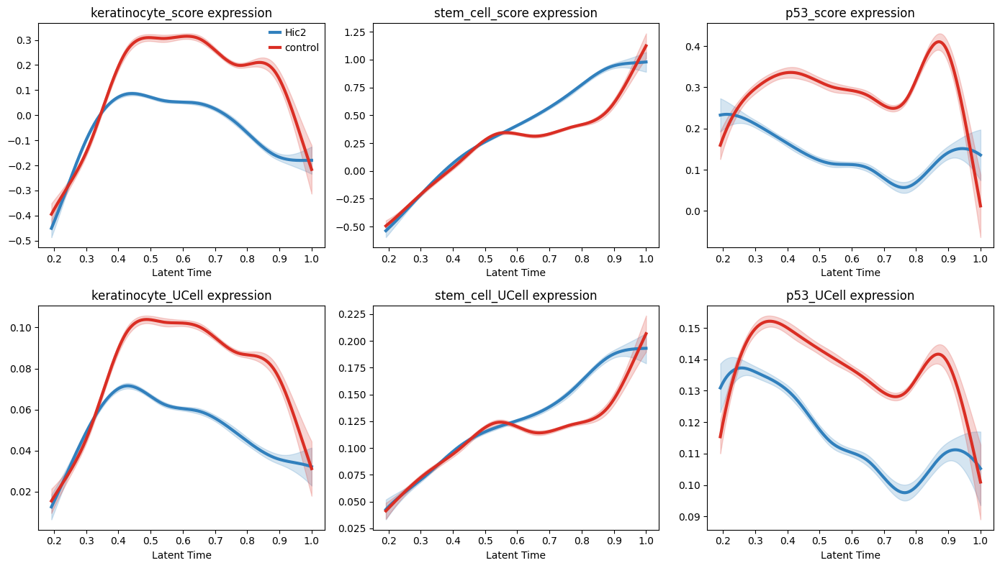

In [188]:
single_cell_analysis.plot_grouped_gene_trend(adata, network_scores+network_scores_ucell, groups=["Hic2", "control"], columns=3, n_splines=10)

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/legacy_api_wrap/__init__.py:88: UserWarning: X converted to numpy array with dtype float64
  return fn(*args_all, **kw)


  0%|          | 0/6 [00:00<?, ?gene/s]

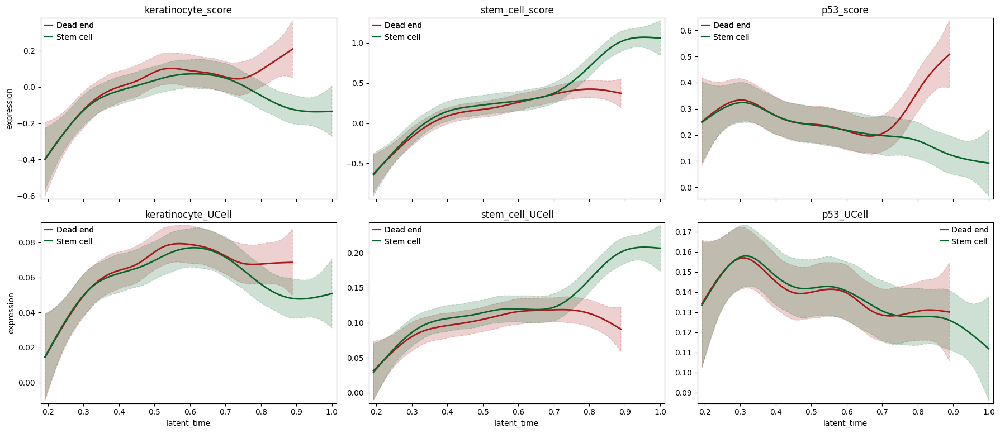

In [189]:
single_cell_analysis.plot_trends_by_trajectory(adata, network_scores+network_scores_ucell, groups=["control"], n_knots=10, n_columns=3)

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/legacy_api_wrap/__init__.py:88: UserWarning: X converted to numpy array with dtype float64
  return fn(*args_all, **kw)


  0%|          | 0/6 [00:00<?, ?gene/s]

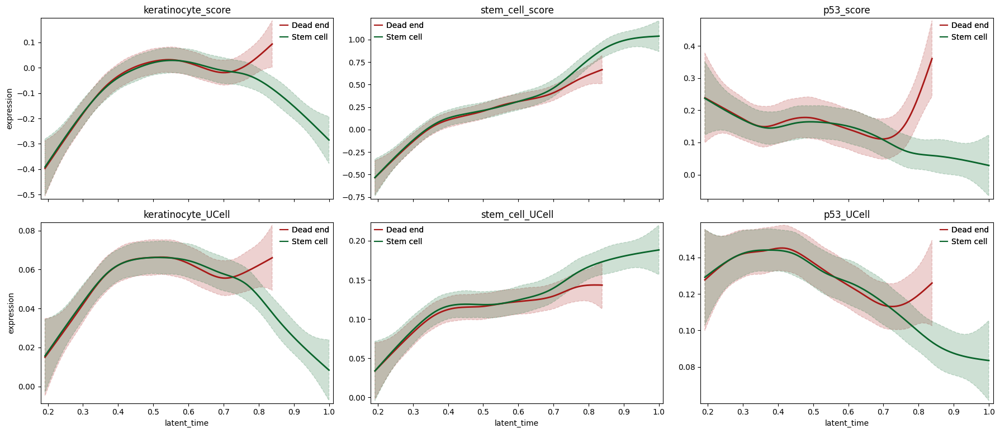

In [190]:
single_cell_analysis.plot_trends_by_trajectory(adata, network_scores+network_scores_ucell, groups=["Hic2"], n_knots=10, n_columns=3)

## With all genes

In [295]:
signatures = {
    "fibroblast": fibroblast_markers,
    "keratinocyte": keratinocyte_markers,
    "epithelial": epithelial_markers,
    "stem_cell": stem_cell_markers,
    "p53": p53_markers,
    "e2f": e2f_targets,
    "g2m": g2m_markers
}

# Remove old scores
for name in signatures.keys():
    ucell_key = f"{name}_UCell"
    if ucell_key in adata_raw.obs_keys():
        del adata_raw.obs[ucell_key]

pyucell.compute_ucell_scores(adata_raw, signatures=signatures, chunk_size=500)

In [296]:
# Score cell types

for name, genes in signatures.items():
    scanpy.tl.score_genes(
        adata_raw,
        gene_list=numpy.intersect1d(genes, adata.var_names),
        score_name=f"{name}_score",
        use_raw=False
    )

network_scores = ["keratinocyte_score", "stem_cell_score", "p53_score"]
network_scores_ucell = ["keratinocyte_UCell", "stem_cell_UCell", "p53_UCell"]

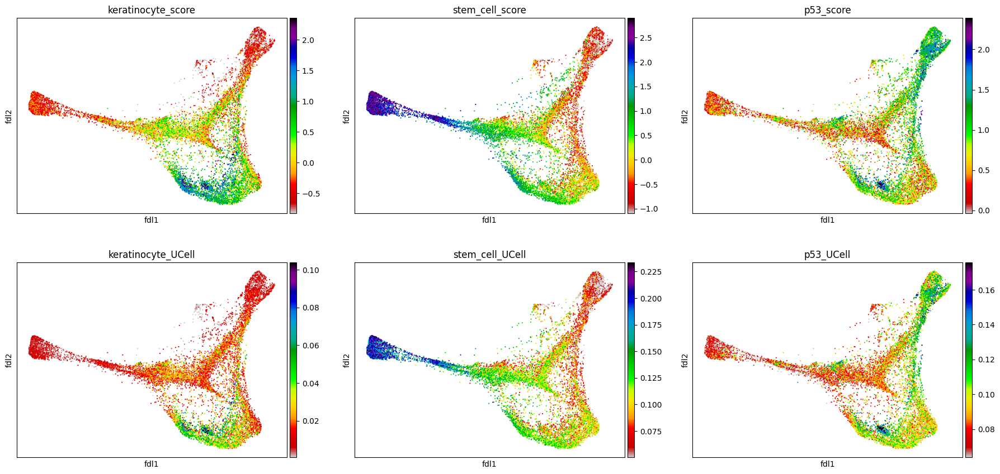

In [181]:
scanpy.pl.embedding(adata_raw, "fdl", color=network_scores+network_scores_ucell, cmap="nipy_spectral_r", vmax="p99.9", vmin="p10", ncols=3)

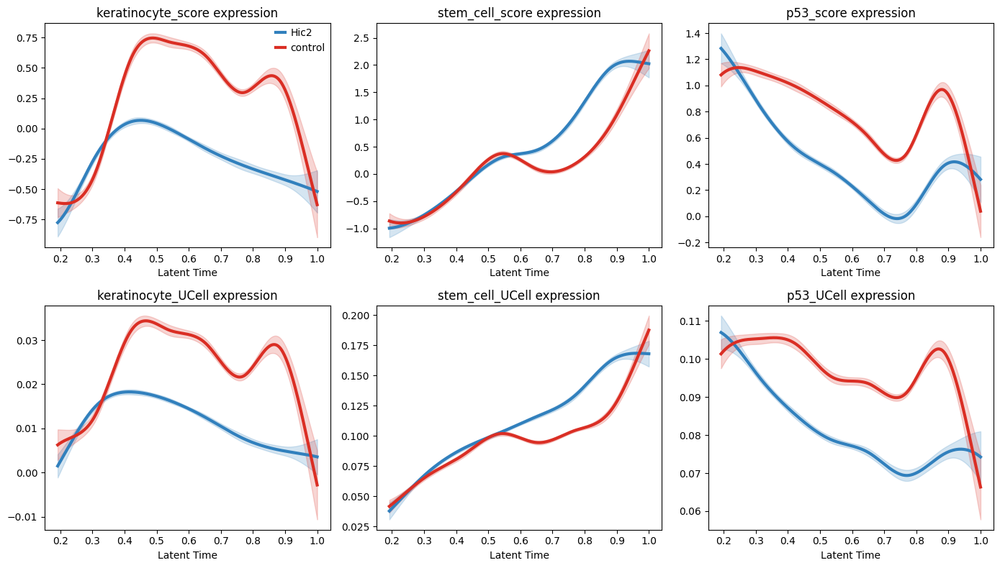

In [182]:
single_cell_analysis.plot_grouped_gene_trend(adata_raw, network_scores+network_scores_ucell, groups=["Hic2", "control"], columns=3, n_splines=10)

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/legacy_api_wrap/__init__.py:88: UserWarning: X converted to numpy array with dtype float64
  return fn(*args_all, **kw)


  0%|          | 0/6 [00:00<?, ?gene/s]

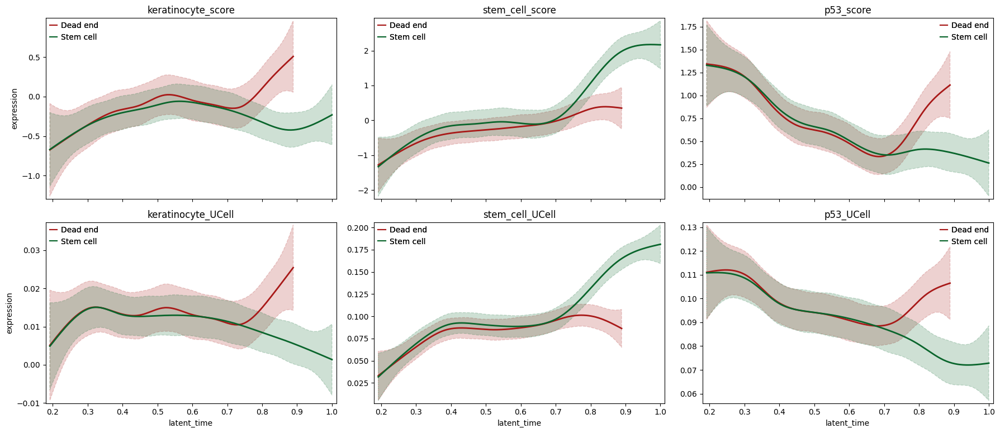

In [183]:
single_cell_analysis.plot_trends_by_trajectory(adata_raw, network_scores+network_scores_ucell, groups=["control"], n_knots=10, n_columns=3)

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/legacy_api_wrap/__init__.py:88: UserWarning: X converted to numpy array with dtype float64
  return fn(*args_all, **kw)


  0%|          | 0/6 [00:00<?, ?gene/s]

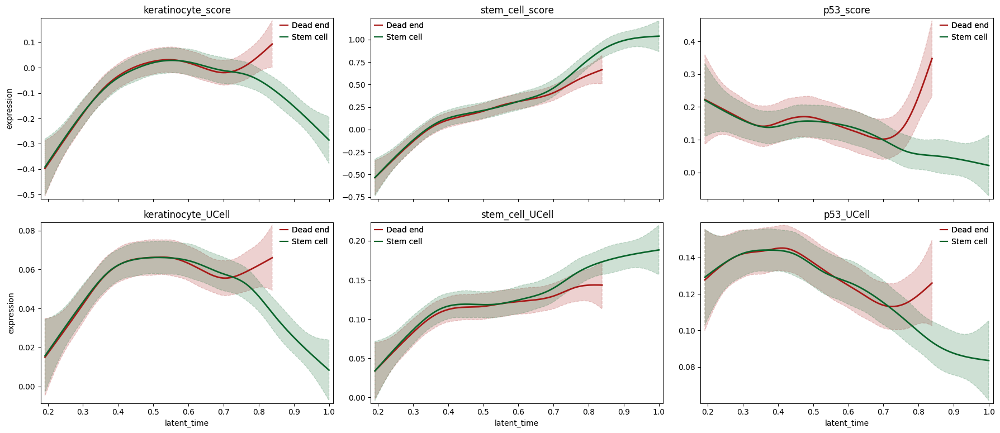

In [184]:
single_cell_analysis.plot_trends_by_trajectory(adata, network_scores+network_scores_ucell, groups=["Hic2"], n_knots=10, n_columns=3)

/tmp/ipykernel_868631/4107928372.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
/tmp/ipykernel_868631/4107928372.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")


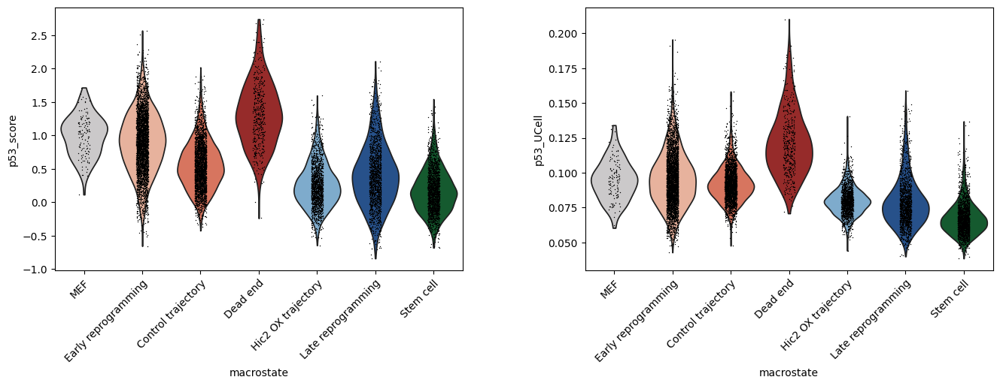

In [ ]:
axes = scanpy.pl.violin(adata_raw, ["p53_score", "p53_UCell"], groupby="macrostate", show=False, use_raw=False)
for axis in axes:
    axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

/tmp/ipykernel_868631/861935302.py:5: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
/tmp/ipykernel_868631/861935302.py:5: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")


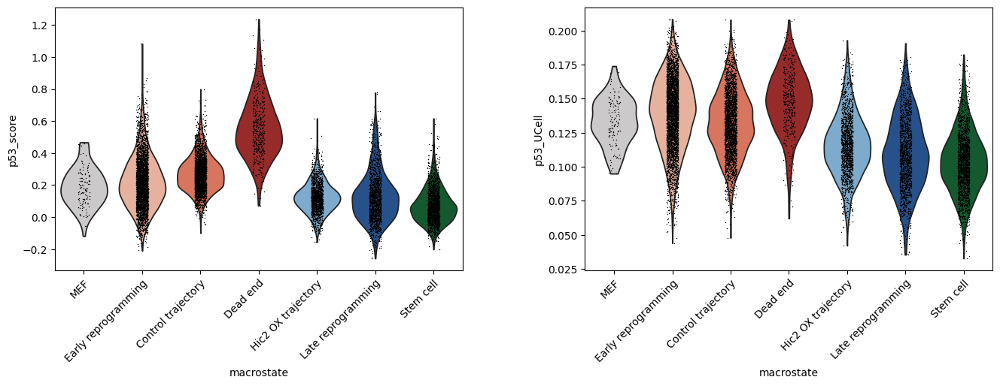

In [ ]:
# Compare with top 2000

axes = scanpy.pl.violin(adata, ["p53_score", "p53_UCell"], groupby="macrostate", show=False, use_raw=False)
for axis in axes:
    axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

## AUCell

Not working for some reason, terrible documentation

In [158]:
import pyscenic
from pyscenic import aucell

In [288]:
aucell_signatures = {}
for name, genes in signatures.items():
    valid_genes = [gene for gene in genes if gene in adata_raw.var_names]
    weight_dict = {gene: 1.0 for gene in valid_genes}
    aucell_signature = pyscenic.aucell.GeneSignature(name, weight_dict)
    aucell_signatures[name] = aucell_signature

In [289]:
expression_matrix = pandas.DataFrame(
    adata_raw.X.todense(), 
    index=adata_raw.obs.index, 
    columns=adata_raw.var_names
)
rank_matrix = aucell.create_rankings(expression_matrix)

In [290]:
result = aucell.aucell4r(rank_matrix, aucell_signatures.values())

In [291]:
# Add AUCell scores to adata_raw

for gene_set in result.columns:
    adata_raw.obs[f"{gene_set}_aucell"] = result[gene_set]

network_scores_aucell = ["keratinocyte_aucell", "stem_cell_aucell", "p53_aucell"]

/tmp/ipykernel_868631/3239475402.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
/tmp/ipykernel_868631/3239475402.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
/tmp/ipykernel_868631/3239475402.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")


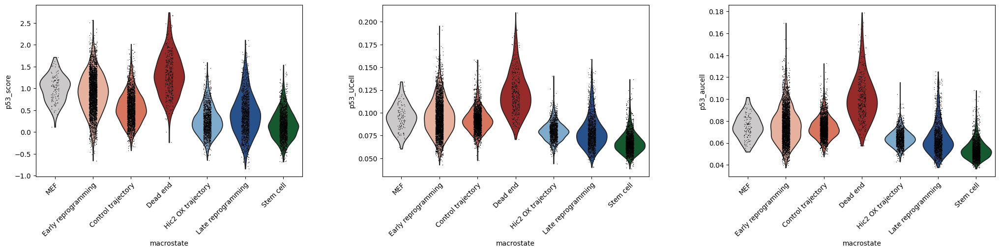

In [246]:
axes = scanpy.pl.violin(adata_raw, ["p53_score", "p53_UCell", "p53_aucell"], groupby="macrostate", show=False, use_raw=False)
for axis in axes:
    axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

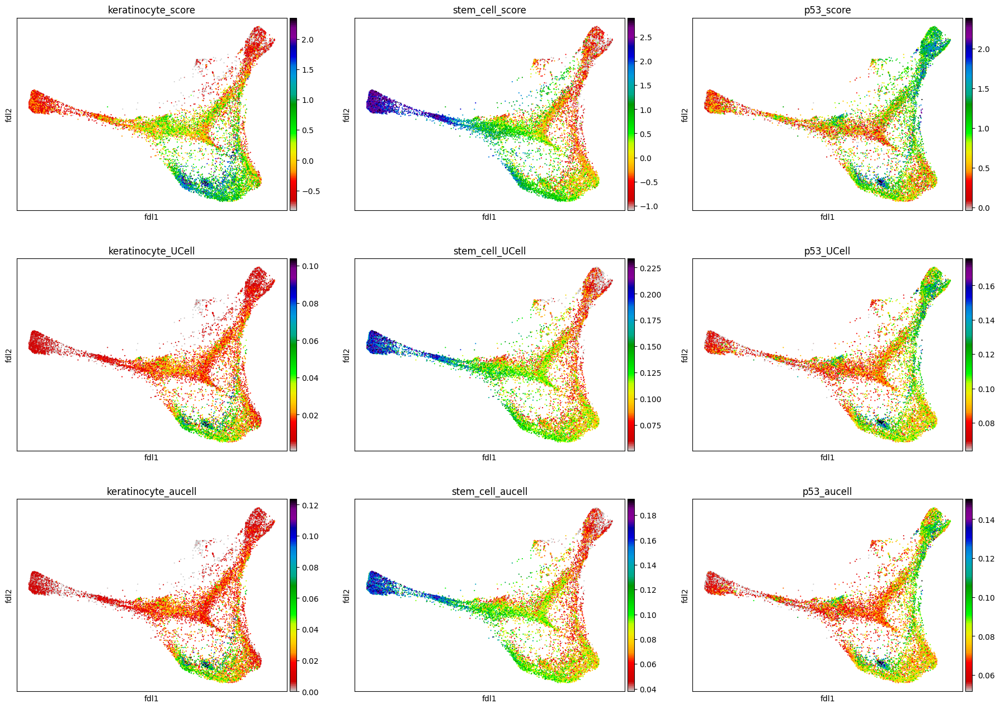

In [243]:
scanpy.pl.embedding(adata_raw, "fdl", color=network_scores+network_scores_ucell+network_scores_aucell, cmap="nipy_spectral_r", vmax="p99.9", vmin="p10", ncols=3)

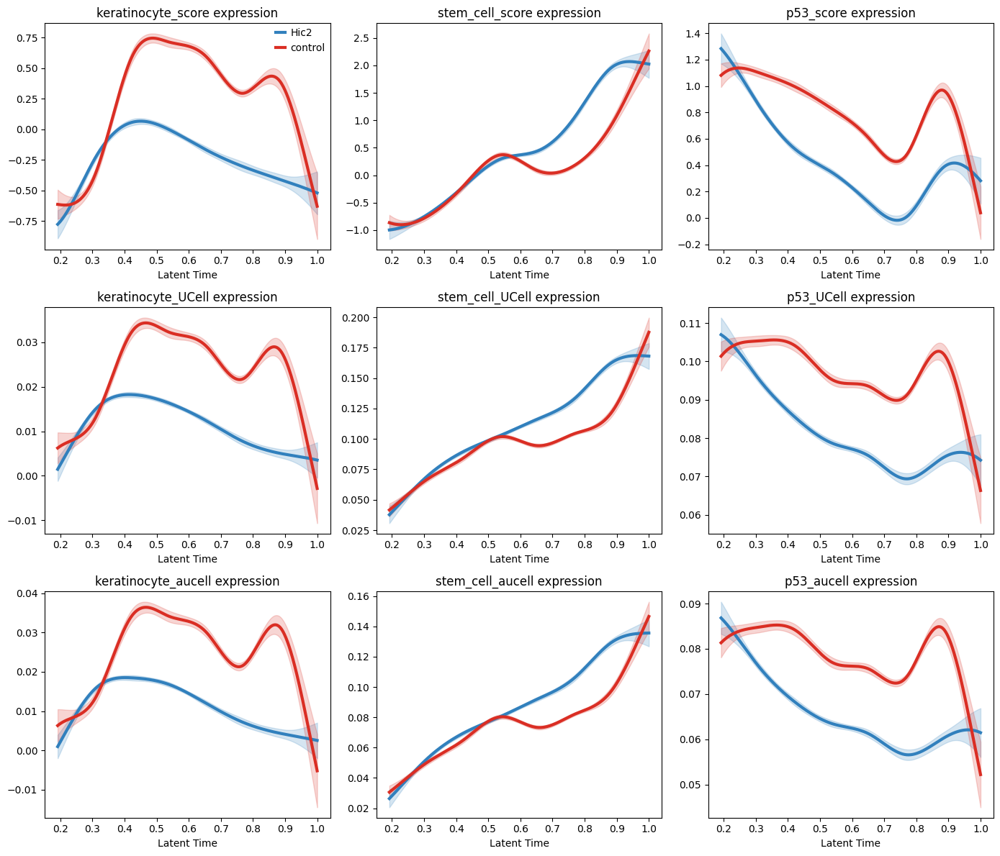

In [244]:
single_cell_analysis.plot_grouped_gene_trend(adata_raw, network_scores+network_scores_ucell+network_scores_aucell, groups=["Hic2", "control"], columns=3, n_splines=10)

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/legacy_api_wrap/__init__.py:88: UserWarning: X converted to numpy array with dtype float64
  return fn(*args_all, **kw)


  0%|          | 0/9 [00:00<?, ?gene/s]

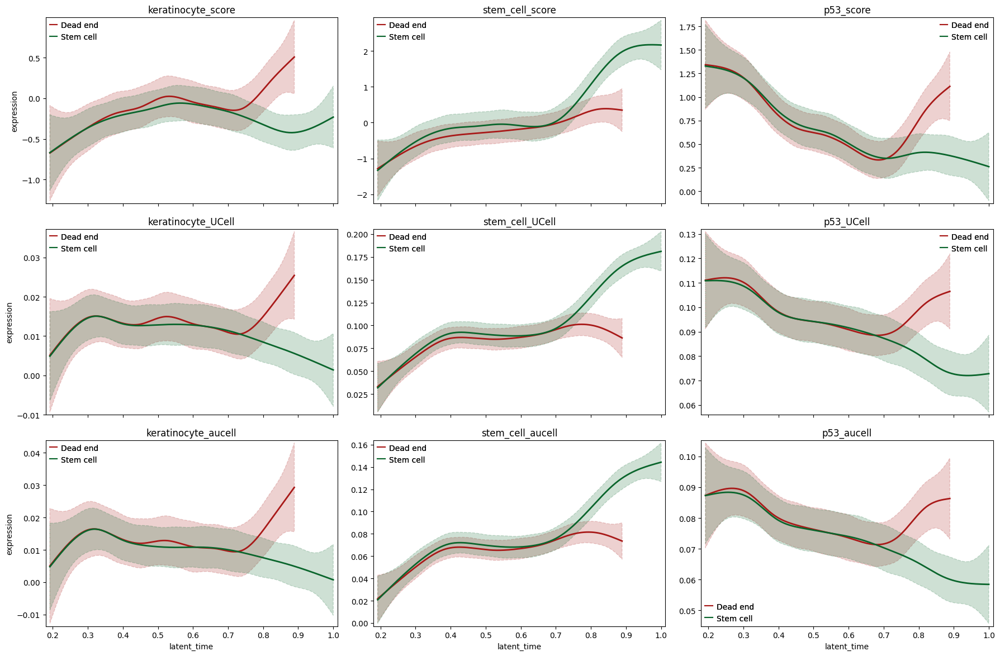

In [253]:
single_cell_analysis.plot_trends_by_trajectory(adata_raw, network_scores+network_scores_ucell+network_scores_aucell, groups=["control"], n_knots=10, n_columns=3)

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/legacy_api_wrap/__init__.py:88: UserWarning: X converted to numpy array with dtype float64
  return fn(*args_all, **kw)


  0%|          | 0/9 [00:00<?, ?gene/s]

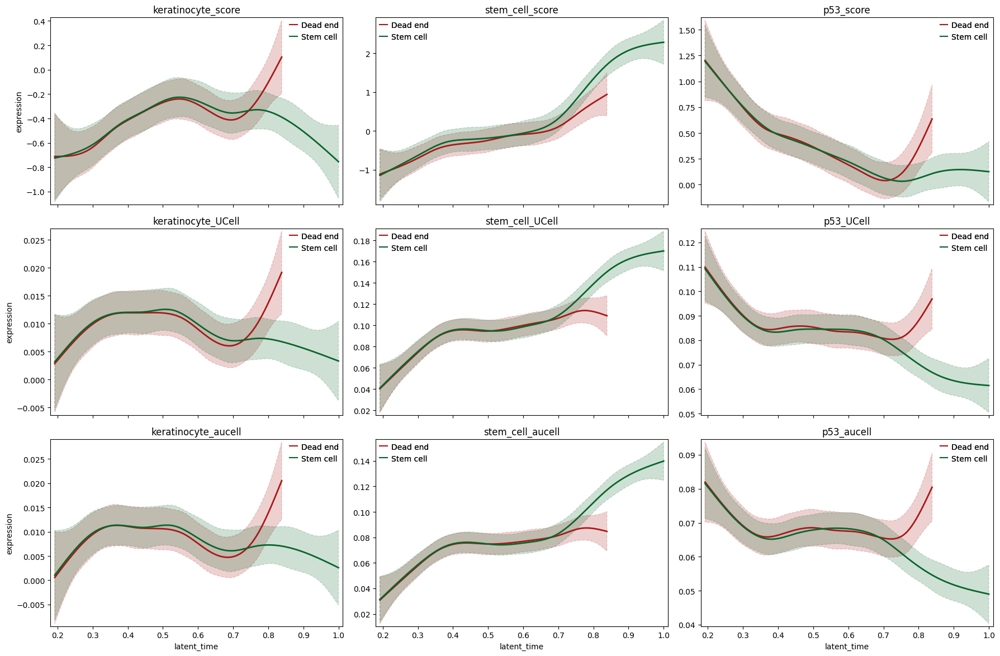

In [255]:
single_cell_analysis.plot_trends_by_trajectory(adata_raw, network_scores+network_scores_ucell+network_scores_aucell, groups=["Hic2"], n_knots=10, n_columns=3)

## AUCell with top 2000

In [228]:
aucell_signatures = {}
for name, genes in signatures.items():
    valid_genes = [gene for gene in genes if gene in adata.var_names]
    weight_dict = {gene: 1.0 for gene in valid_genes}
    aucell_signature = pyscenic.aucell.GeneSignature(name, weight_dict)
    aucell_signatures[name] = aucell_signature

In [229]:
expression_matrix = pandas.DataFrame(
    adata.X.todense(), 
    index=adata.obs.index, 
    columns=adata.var_names
)
rank_matrix = aucell.create_rankings(expression_matrix)

In [231]:
result = aucell.aucell4r(rank_matrix, aucell_signatures.values())

# Add AUCell scores to adata

for gene_set in result.columns:
    adata.obs[f"{gene_set}_aucell"] = result[gene_set]

network_scores_aucell = ["keratinocyte_aucell", "stem_cell_aucell", "p53_aucell"]

/tmp/ipykernel_868631/2326393183.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
/tmp/ipykernel_868631/2326393183.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
/tmp/ipykernel_868631/2326393183.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")


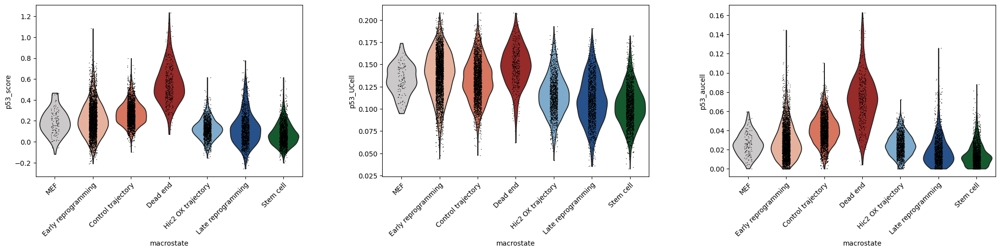

In [232]:
axes = scanpy.pl.violin(adata, ["p53_score", "p53_UCell", "p53_aucell"], groupby="macrostate", show=False, use_raw=False)
for axis in axes:
    axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

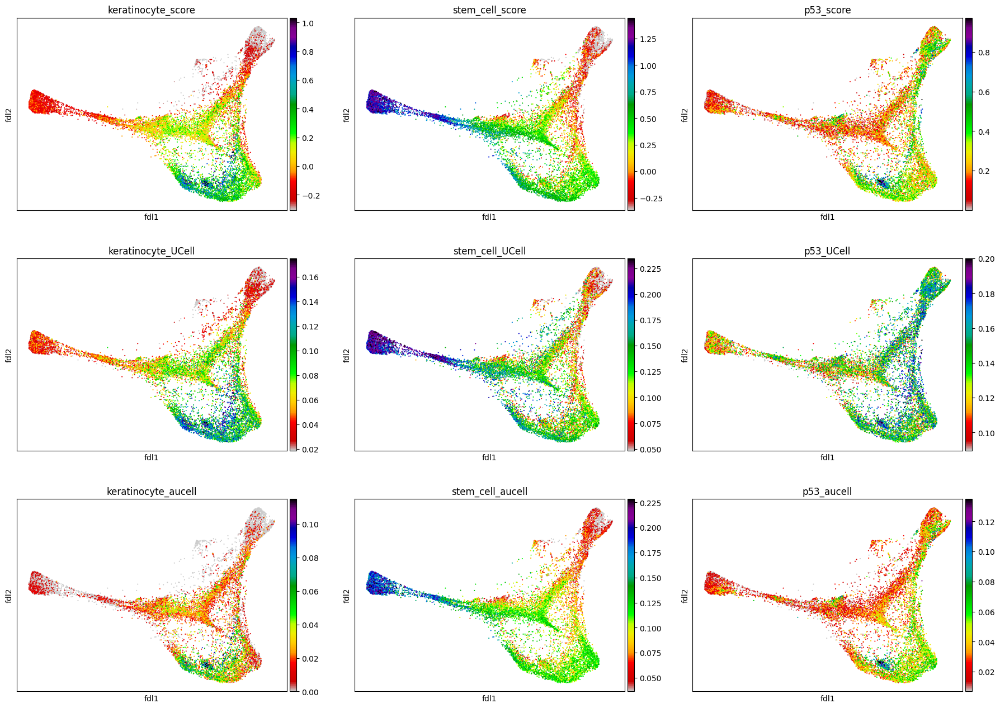

In [252]:
scanpy.pl.embedding(adata, "fdl", color=network_scores+network_scores_ucell+network_scores_aucell, cmap="nipy_spectral_r", vmax="p99.9", vmin="p10", ncols=3)

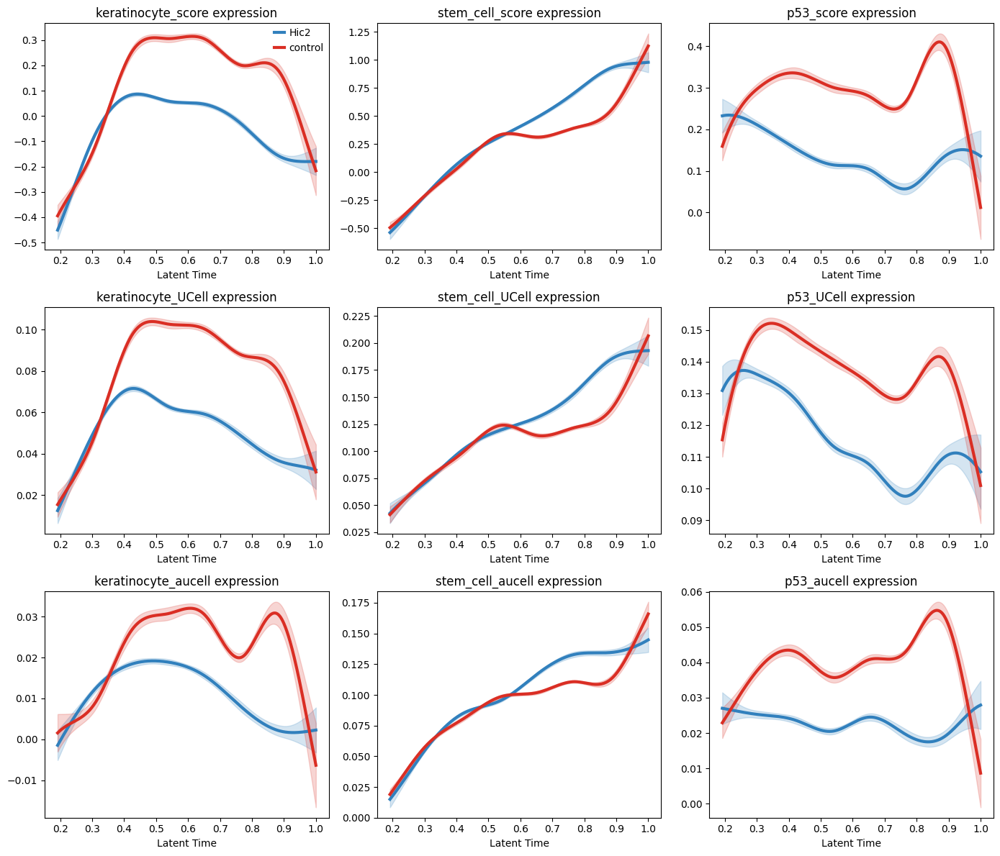

In [234]:
single_cell_analysis.plot_grouped_gene_trend(adata, network_scores+network_scores_ucell+network_scores_aucell, groups=["Hic2", "control"], columns=3, n_splines=10)

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/legacy_api_wrap/__init__.py:88: UserWarning: X converted to numpy array with dtype float64
  return fn(*args_all, **kw)


  0%|          | 0/9 [00:00<?, ?gene/s]

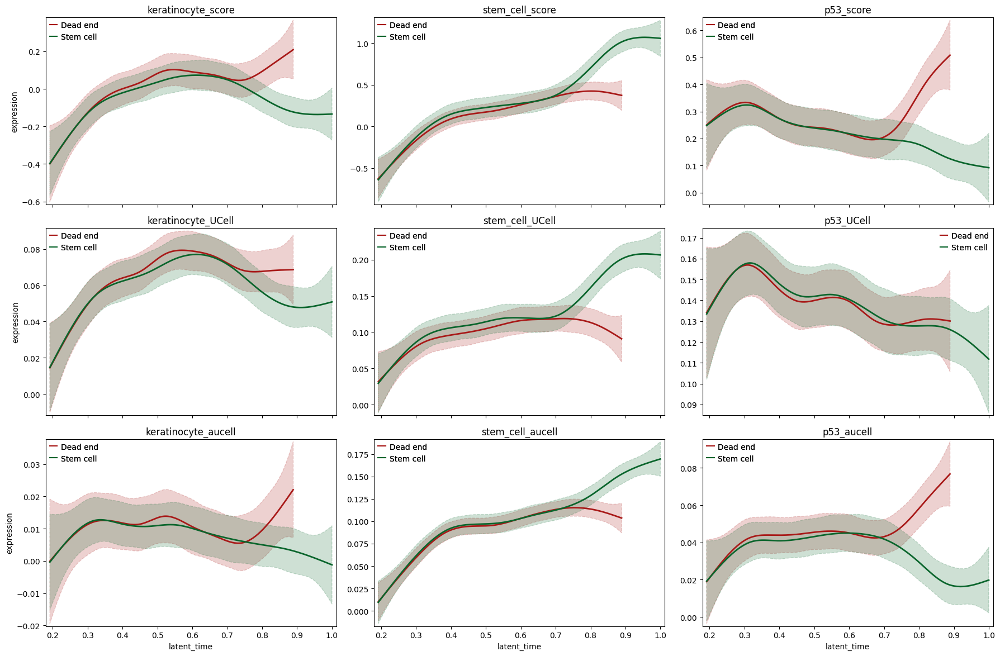

In [236]:
single_cell_analysis.plot_trends_by_trajectory(adata, network_scores+network_scores_ucell+network_scores_aucell, groups=["control"], n_knots=10, n_columns=3)

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/legacy_api_wrap/__init__.py:88: UserWarning: X converted to numpy array with dtype float64
  return fn(*args_all, **kw)


  0%|          | 0/9 [00:00<?, ?gene/s]

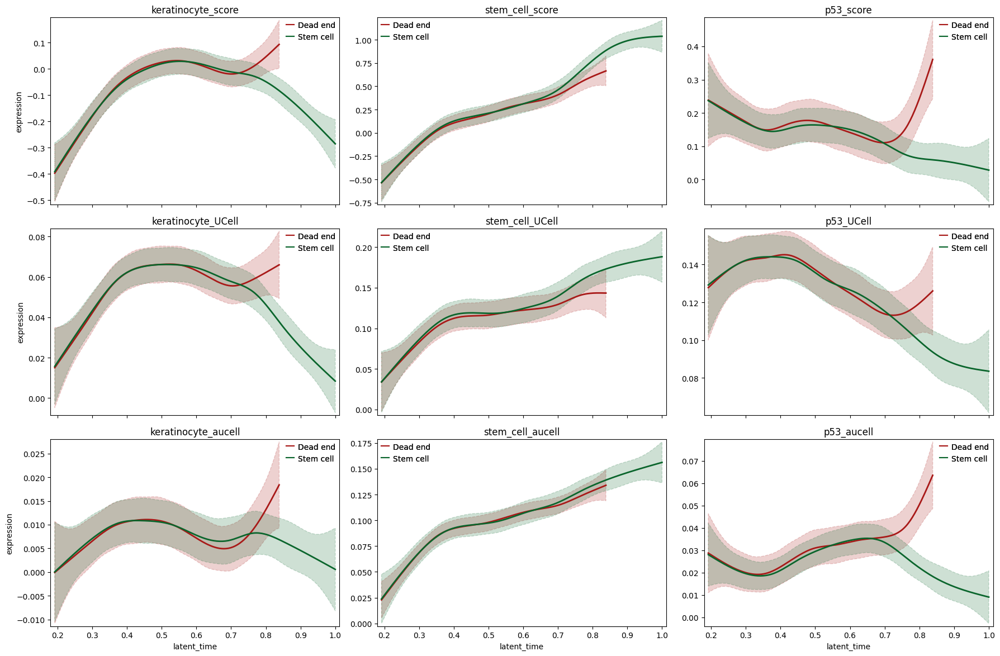

In [237]:
single_cell_analysis.plot_trends_by_trajectory(adata, network_scores+network_scores_ucell+network_scores_aucell, groups=["Hic2"], n_knots=10, n_columns=3)

## Require expression in 1% of cells

In [259]:
# Load adata with raw counts and filter

adata_1_percent = scanpy.read_h5ad(
    working_directory+f"/splice_counts.h5ad"
)

# If all genes should be used instead of just top 2000 variable

scanpy.pp.filter_genes(adata_1_percent, min_cells=0.01*len(adata_raw))
scanpy.pp.normalize_total(adata_1_percent, target_sum=1e6)
scanpy.pp.log1p(adata_1_percent)
adata_1_percent.obs = adata.obs
adata_1_percent.obsm = adata.obsm
adata_1_percent.uns["term_states_fwd_colors"] = adata.uns["term_states_fwd_colors"]
adata_1_percent.uns = adata.uns

print(adata_1_percent)

AnnData object with n_obs × n_vars = 12791 × 16015
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'seurat_clusters', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'latent_time', 'sde_velocity_self_transition', 'manual_root', 'manual_end', 'sde_velocity_pseudotime', 'leiden', 'macrostates_fwd', 'term_states_fwd', 'term_states_fwd_probs', 'init_states_fwd', 'init_states_fwd_probs', 'fate_probabilities_Dead end', 'fate_probabilities_Stem cell', 'macrostate', 'early_or_late', 'epithelial_score', 'keratinocyte_score', 'stem_cell_score', 'fibroblast_score', 'neuron_score', 'kupffer_score', 'apoptosis_score', 'p53_score', 'fibroblast_UCell', 'keratinocyte_UCell', 'epithelial_UCell', 'stem_cell_UCell', 'p53_UCell', 'fibroblast_aucell', 'keratinocyte_aucell', 'epithelial_aucell', 'stem_cell_aucell', 'p53_aucell'
    var: 'ensemble_ids', 'gene_symbol', 'n_cells'
    uns: 'T_fwd_params

In [267]:
signatures = {
    "fibroblast": fibroblast_markers,
    "keratinocyte": keratinocyte_markers,
    "epithelial": epithelial_markers,
    "stem_cell": stem_cell_markers,
    "p53": p53_markers
}

# Remove old scores
for name in signatures.keys():
    ucell_key = f"{name}_UCell"
    if ucell_key in adata_1_percent.obs_keys():
        del adata_1_percent.obs[ucell_key]

pyucell.compute_ucell_scores(adata_1_percent, signatures=signatures, chunk_size=500)

In [260]:
aucell_signatures = {}
for name, genes in signatures.items():
    valid_genes = [gene for gene in genes if gene in adata_1_percent.var_names]
    weight_dict = {gene: 1.0 for gene in valid_genes}
    aucell_signature = pyscenic.aucell.GeneSignature(name, weight_dict)
    aucell_signatures[name] = aucell_signature

expression_matrix = pandas.DataFrame(
    adata_1_percent.X.todense(), 
    index=adata_1_percent.obs.index, 
    columns=adata_1_percent.var_names
)
rank_matrix = aucell.create_rankings(expression_matrix)

In [261]:
result = aucell.aucell4r(rank_matrix, aucell_signatures.values())

# Add AUCell scores to adata

for gene_set in result.columns:
    adata_1_percent.obs[f"{gene_set}_aucell"] = result[gene_set]

network_scores_aucell = ["keratinocyte_aucell", "stem_cell_aucell", "p53_aucell"]

/tmp/ipykernel_868631/2966356965.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
/tmp/ipykernel_868631/2966356965.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
/tmp/ipykernel_868631/2966356965.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")


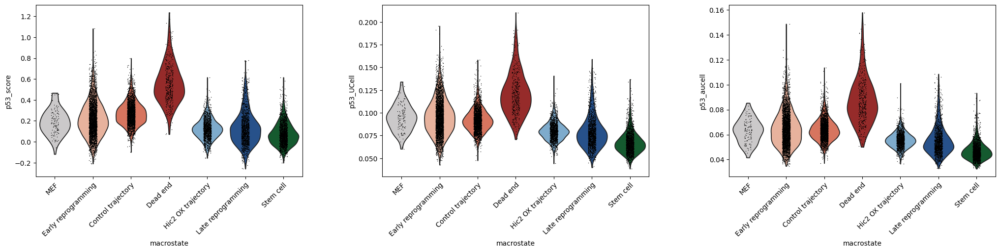

In [268]:
axes = scanpy.pl.violin(adata_1_percent, ["p53_score", "p53_UCell", "p53_aucell"], groupby="macrostate", show=False, use_raw=False)
for axis in axes:
    axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

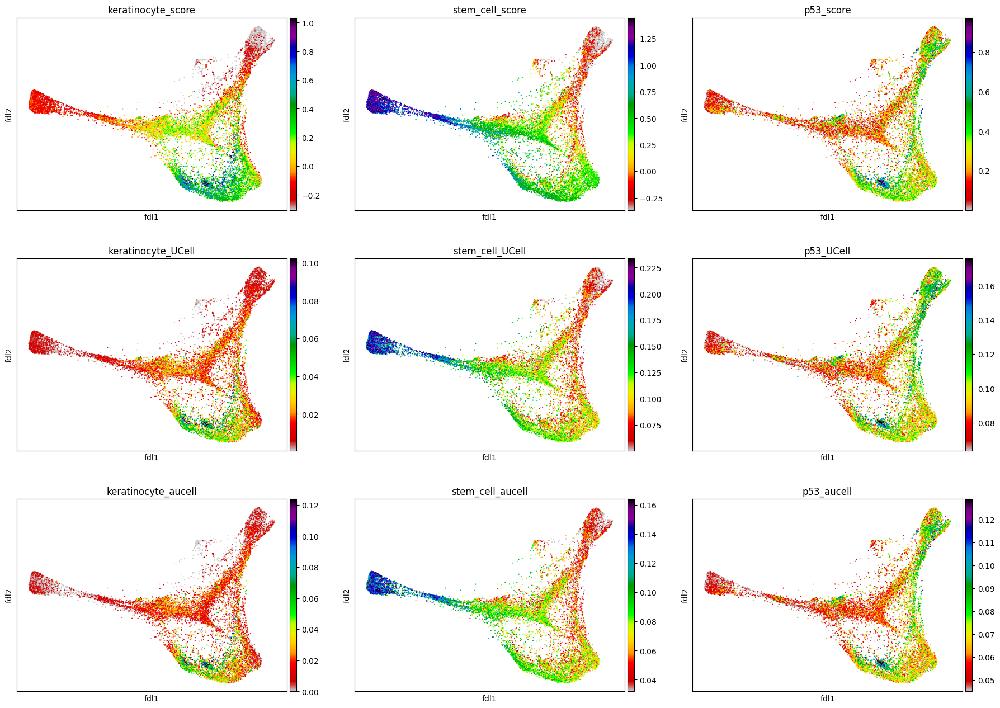

In [277]:
scanpy.pl.embedding(adata_1_percent, "fdl", color=network_scores+network_scores_ucell+network_scores_aucell, cmap="nipy_spectral_r", vmax="p99.9", vmin="p10", ncols=3)

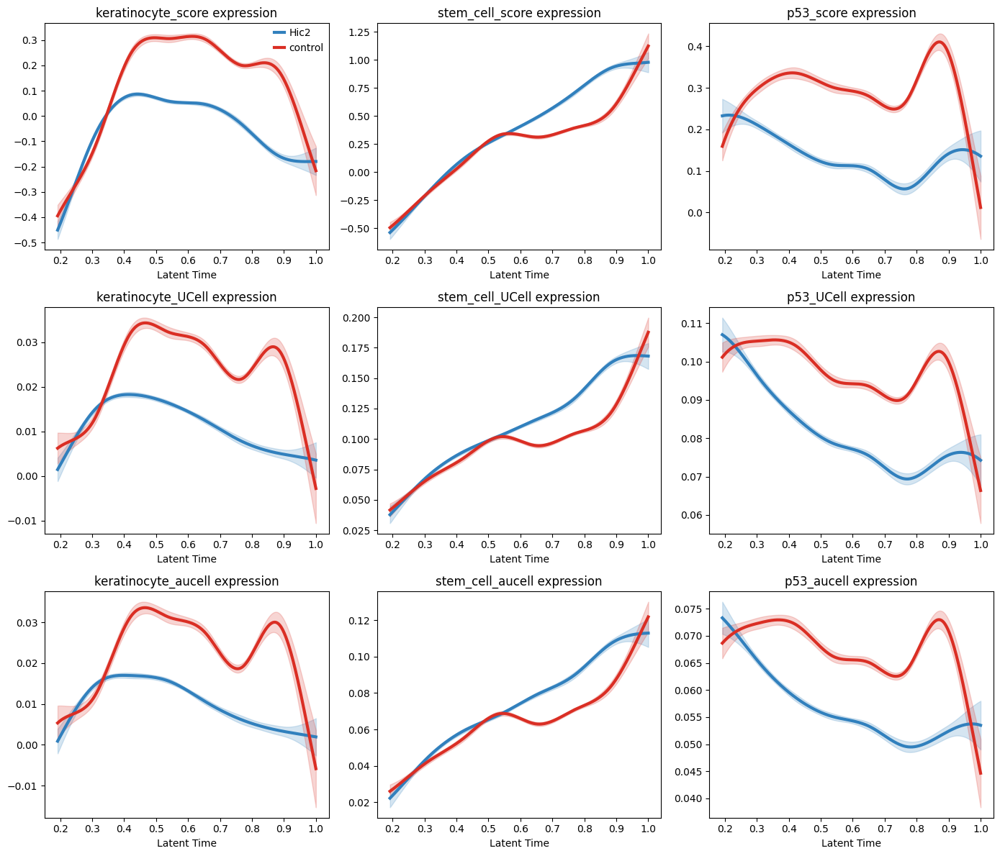

In [270]:
single_cell_analysis.plot_grouped_gene_trend(adata_1_percent, network_scores+network_scores_ucell+network_scores_aucell, groups=["Hic2", "control"], columns=3, n_splines=10)

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/legacy_api_wrap/__init__.py:88: UserWarning: X converted to numpy array with dtype float64
  return fn(*args_all, **kw)


  0%|          | 0/9 [00:00<?, ?gene/s]

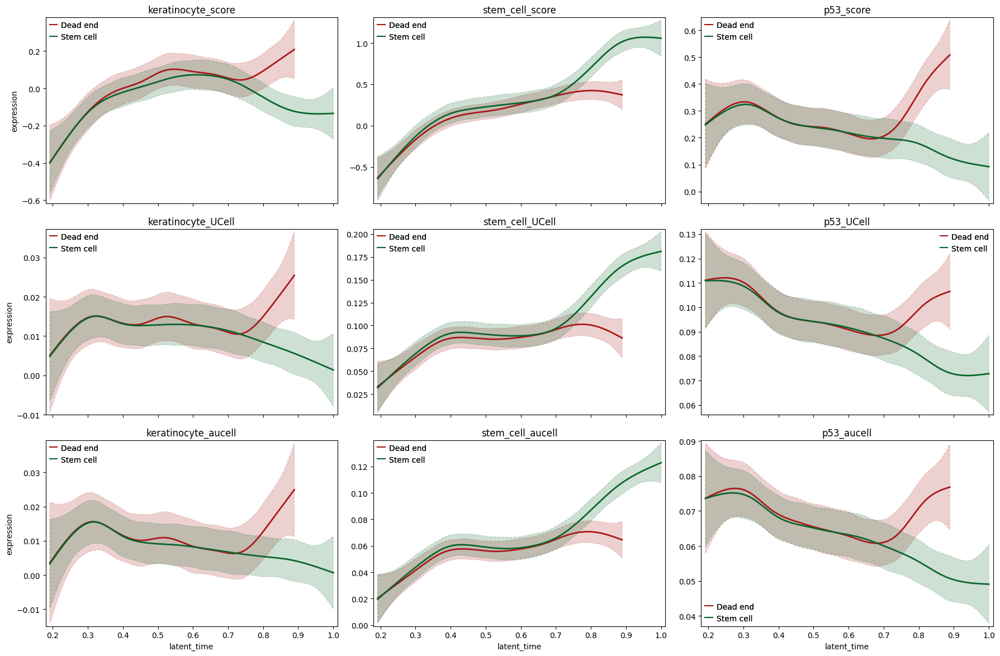

In [275]:
single_cell_analysis.plot_trends_by_trajectory(adata_1_percent, network_scores+network_scores_ucell+network_scores_aucell, groups=["control"], n_knots=10, n_columns=3)

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/legacy_api_wrap/__init__.py:88: UserWarning: X converted to numpy array with dtype float64
  return fn(*args_all, **kw)


  0%|          | 0/9 [00:00<?, ?gene/s]

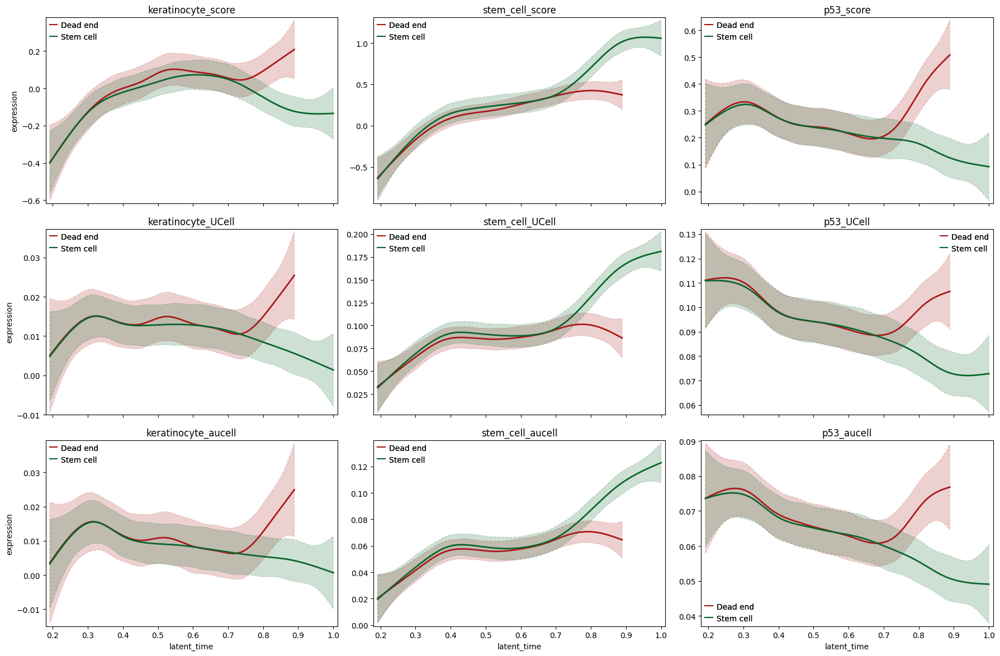

In [272]:
single_cell_analysis.plot_trends_by_trajectory(adata_1_percent, network_scores+network_scores_ucell+network_scores_aucell, groups=["control"], n_knots=10, n_columns=3)

# Test additional damage gene sets

/tmp/ipykernel_868631/1890772413.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
/tmp/ipykernel_868631/1890772413.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")


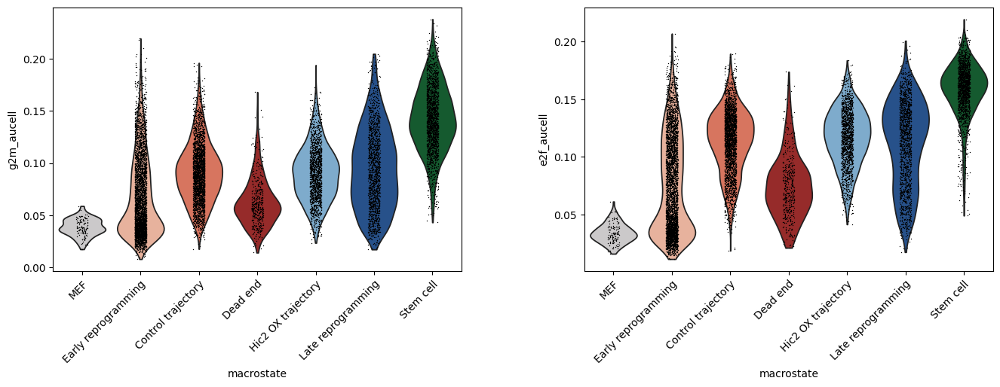

In [298]:
axes = scanpy.pl.violin(adata_raw, ["g2m_aucell", "e2f_aucell"], groupby="macrostate", show=False, use_raw=False)
for axis in axes:
    axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

## Use only p53 markers that are overexpressed in the dead end

In [306]:
# Get genes that are overexpressed in dead end

dead_end_de_df = pandas.read_csv("RNA Sequencing Data/macrostate_differential_expression_Dead end.csv", index_col=0)

In [329]:
damage_markers = ["Atf3", "Jund", "Perp", "Jun", "Cdkn1a", "Fos", "Mxi1", "Maff"]

In [ ]:
damage_markers = ["Atf3", "Mxd1", "Maff", "Zbtb10"]
p53_100 = numpy.intersect1d(p53_markers, dead_end_de_df.head(100).index)
p53_200 = numpy.intersect1d(p53_markers, dead_end_de_df.head(200).index)
p53_300 = numpy.intersect1d(p53_markers, dead_end_de_df.head(300).index)
p53_500 = numpy.intersect1d(p53_markers, dead_end_de_df.head(500).index)
p53_1000 = numpy.intersect1d(p53_markers, dead_end_de_df.head(500).index)
damage_sets = {"damage": damage_markers, "dead_end_p53": dead_end_p53}

In [406]:
aucell_signatures = []
top_de_list = [50, 100, 200, 500, 1000, 2000]
for top_de in top_de_list:
    genes = numpy.intersect1d(p53_markers, dead_end_de_df.head(top_de).index)
    valid_genes = [gene for gene in genes if gene in adata.var_names]
    weight_dict = {gene: 1.0 for gene in valid_genes}
    aucell_signature = pyscenic.aucell.GeneSignature(f"p53_top_{top_de}", weight_dict)
    aucell_signatures.append(aucell_signature)

expression_matrix = pandas.DataFrame(
    adata_raw.X.todense(), 
    index=adata_raw.obs.index, 
    columns=adata_raw.var_names
)
rank_matrix = aucell.create_rankings(expression_matrix)

# Run AUCell
result = aucell.aucell4r(rank_matrix, aucell_signatures)

# Add AUCell scores to adata
for gene_set in result.columns:
    adata_raw.obs[f"{gene_set}_aucell"] = result[gene_set]

score_columns = [f"p53_top_{top_de}_aucell" for top_de in top_de_list]

/tmp/ipykernel_868631/4278878012.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
/tmp/ipykernel_868631/4278878012.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
/tmp/ipykernel_868631/4278878012.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
/tmp/ipykernel_868631/4278878012.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axis.set_xticklabels(axis.get_xticklabels(

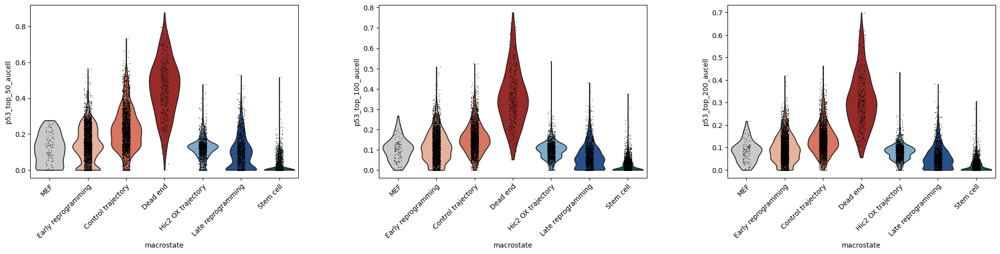

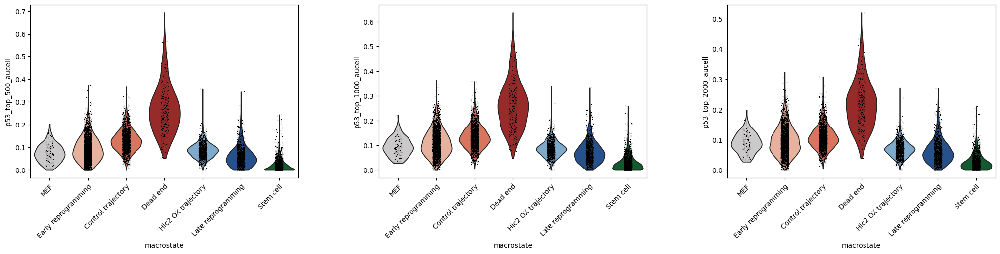

In [407]:
axes = scanpy.pl.violin(adata_raw, score_columns[:3], groupby="macrostate", show=False, use_raw=False)
for axis in axes:
    axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

axes = scanpy.pl.violin(adata_raw, score_columns[3:], groupby="macrostate", show=False, use_raw=False)
for axis in axes:
    axis.set_xticklabels(axis.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

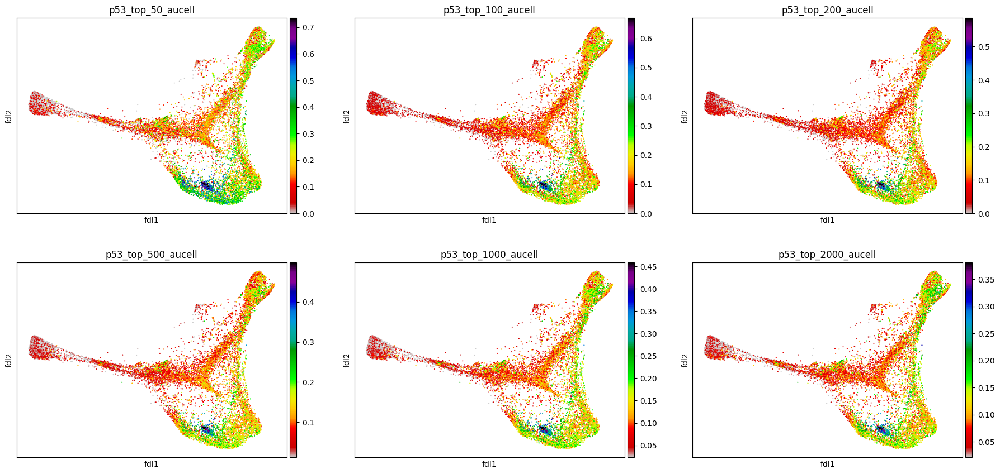

In [408]:
scanpy.pl.embedding(adata_raw, "fdl", color=score_columns, cmap="nipy_spectral_r", vmax="p99.9", vmin="p10", ncols=3)

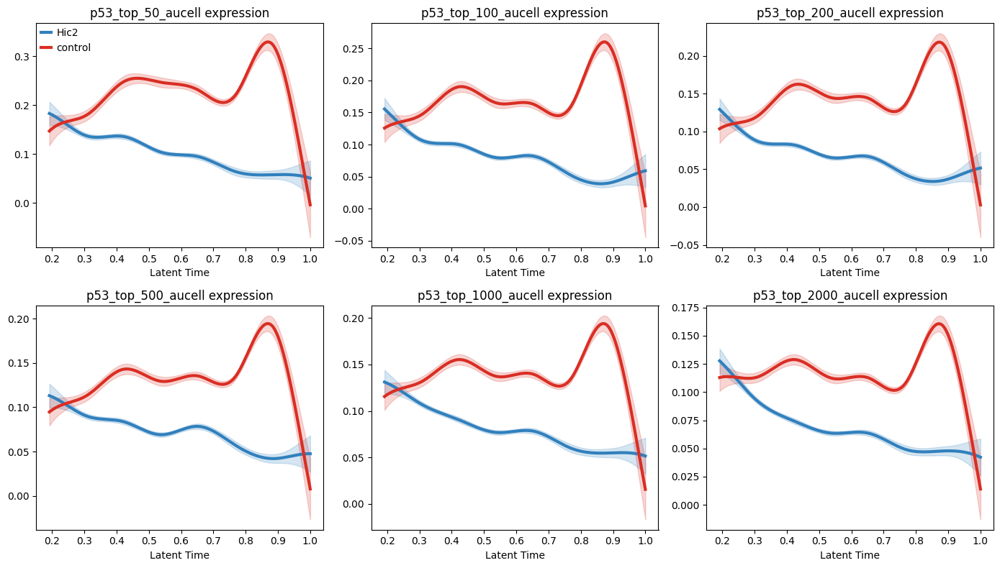

In [409]:
single_cell_analysis.plot_grouped_gene_trend(adata_raw, score_columns, groups=["Hic2", "control"], columns=3, n_splines=10)

  0%|          | 0/6 [00:00<?, ?gene/s]

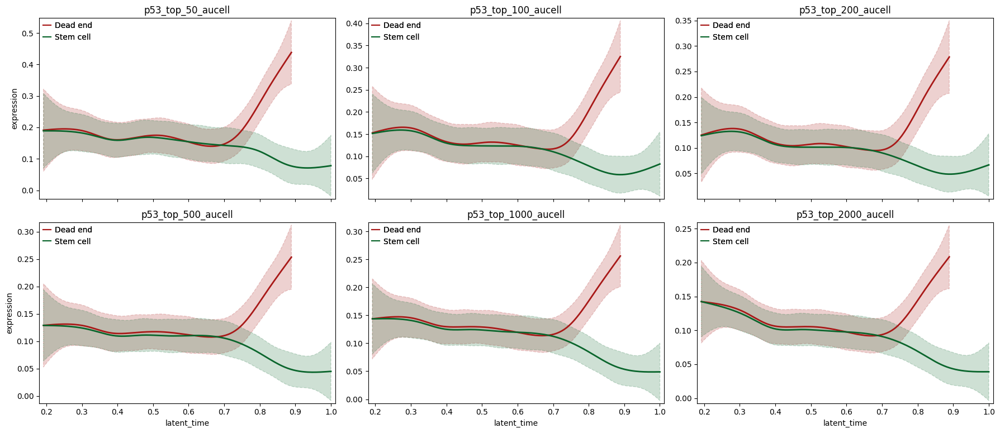

In [410]:
single_cell_analysis.plot_trends_by_trajectory(adata_raw, score_columns, groups=["control"], n_knots=10, n_columns=3)

  0%|          | 0/6 [00:00<?, ?gene/s]

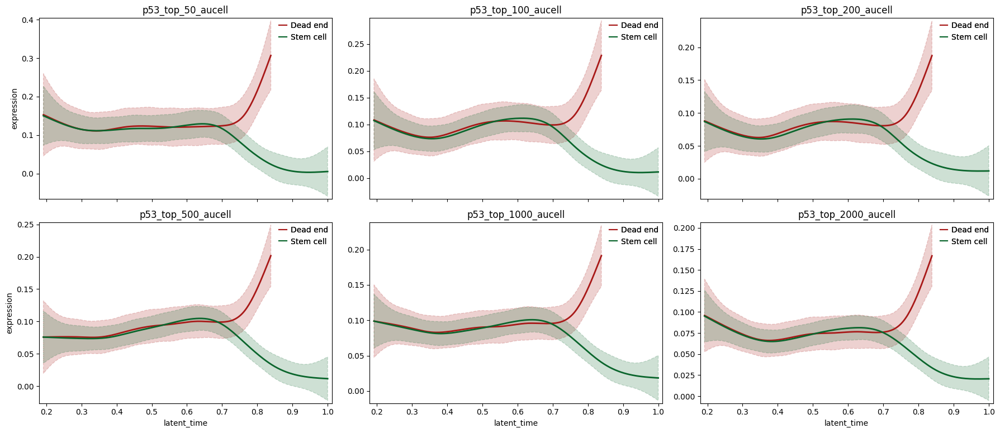

In [411]:
single_cell_analysis.plot_trends_by_trajectory(adata_raw, score_columns, groups=["Hic2"], n_knots=10, n_columns=3)

In [413]:
print(numpy.intersect1d(p53_markers, dead_end_de_df.head(100).index))
print()
print(numpy.intersect1d(p53_markers, dead_end_de_df.head(1000).index))
print()
print(numpy.intersect1d(p53_markers, dead_end_de_df.head(2000).index))

['Atf3' 'Btg1' 'Btg2' 'Cdkn1a' 'Ctsd' 'Jun' 'Krt17' 'Ndrg1' 'Nupr1' 'Perp'
 'Ppp1r15a' 'Rack1' 'Rpl18' 'Rpl36' 'Rps12' 'Sat1' 'Sfn' 'St14' 'Tob1']

['Atf3' 'Baiap2' 'Btg1' 'Btg2' 'Cd81' 'Cdkn1a' 'Ctsd' 'Ddit3' 'Ddit4'
 'Dnttip2' 'Ei24' 'Epha2' 'Ephx1' 'Eps8l2' 'Foxo3' 'Gm2a' 'Gpx2' 'Ifi30'
 'Inhbb' 'Itgb4' 'Jun' 'Krt17' 'Mapkapk3' 'Mdm2' 'Mknk2' 'Mxd1' 'Ndrg1'
 'Nol8' 'Notch1' 'Nupr1' 'Pdgfa' 'Perp' 'Phlda3' 'Plk2' 'Plxnb2' 'Pmm1'
 'Ppp1r15a' 'Ptpn14' 'Rack1' 'Rpl18' 'Rpl36' 'Rps12' 'Sat1' 'Sfn' 'Slc3a2'
 'St14' 'Tob1' 'Trib3' 'Vamp8']

['Acvr1b' 'Ada' 'App' 'Atf3' 'Baiap2' 'Btg1' 'Btg2' 'Cd81' 'Cdkn1a' 'Ctsd'
 'Ddit3' 'Ddit4' 'Def6' 'Dgka' 'Dnttip2' 'Ei24' 'Epha2' 'Ephx1' 'Eps8l2'
 'Ercc5' 'Foxo3' 'Gadd45a' 'Gm2a' 'Gpx2' 'Hmox1' 'Ifi30' 'Inhbb' 'Irak1'
 'Itgb4' 'Jag2' 'Jun' 'Klf4' 'Krt17' 'Mapkapk3' 'Mdm2' 'Mknk2' 'Mxd1'
 'Ndrg1' 'Ninj1' 'Nol8' 'Notch1' 'Nupr1' 'Pdgfa' 'Perp' 'Phlda3' 'Pitpnc1'
 'Plk2' 'Plk3' 'Plxnb2' 'Pmm1' 'Pom121' 'Ppm1d' 'Ppp1r15a' 'Prkab1'
 'Ptpn14' 'Rack1' 'Rpl1

# Conclusion

The best method appears to be using p53 genes that are among the most differentially expressed in the dead end. Between 50 and 2000 top genes, the choice of number of top differentially expressed genes does not affect the results significantly. Top 1000 could be chosen.